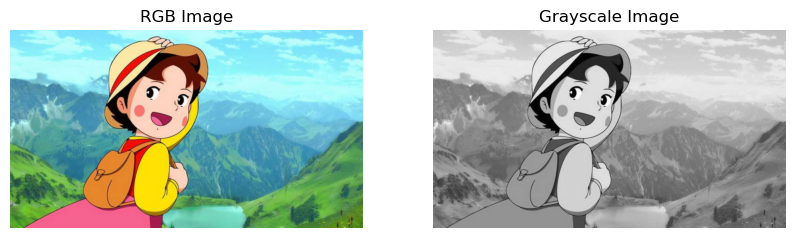

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Read the RGB image
image = cv2.imread("C:/Users/student/Documents/Computer Vision 2023510051/Heidi.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("RGB Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(gray, cmap="gray")
plt.title("Grayscale Image")
plt.axis("off")

plt.show()


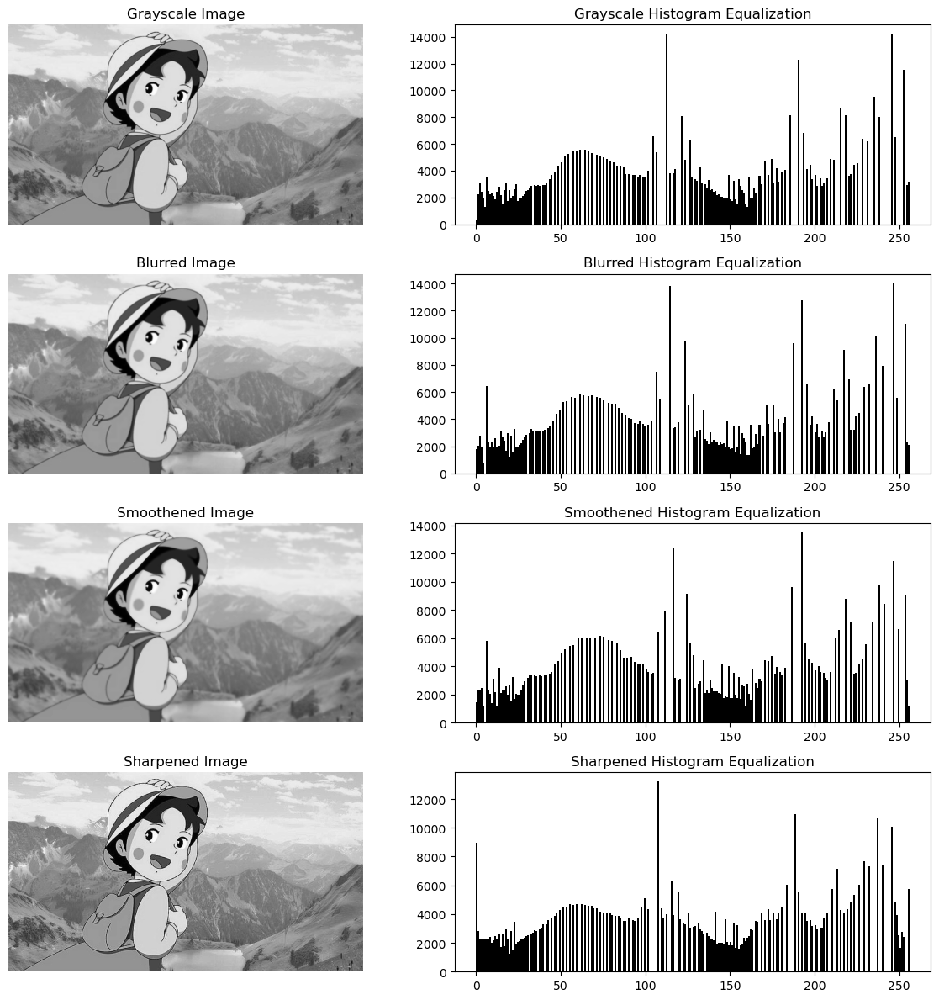

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the RGB image
image = cv2.imread("C:/Users/student/Documents/Computer Vision 2023510051/Heidi.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Apply blurring
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Apply smoothening using bilateral filter
smoothened = cv2.bilateralFilter(gray, 9, 75, 75)

# Apply sharpening
kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
sharpened = cv2.filter2D(gray, -1, kernel)

# Function to compute histogram equalization
def hist_equalization(img):
    return cv2.equalizeHist(img)

# Perform histogram equalization
gray_eq = hist_equalization(gray)
blurred_eq = hist_equalization(blurred)
smoothened_eq = hist_equalization(smoothened)
sharpened_eq = hist_equalization(sharpened)

# Plot the images and histograms
fig, axes = plt.subplots(4, 2, figsize=(12, 12))

titles = ["Grayscale", "Blurred", "Smoothened", "Sharpened"]
images = [gray, blurred, smoothened, sharpened]
equalized = [gray_eq, blurred_eq, smoothened_eq, sharpened_eq]

for i in range(4):
    axes[i, 0].imshow(images[i], cmap="gray")
    axes[i, 0].set_title(f"{titles[i]} Image")
    axes[i, 0].axis("off")

    axes[i, 1].hist(equalized[i].ravel(), bins=256, range=[0, 256], color='black')
    axes[i, 1].set_title(f"{titles[i]} Histogram Equalization")

plt.tight_layout()
plt.show()


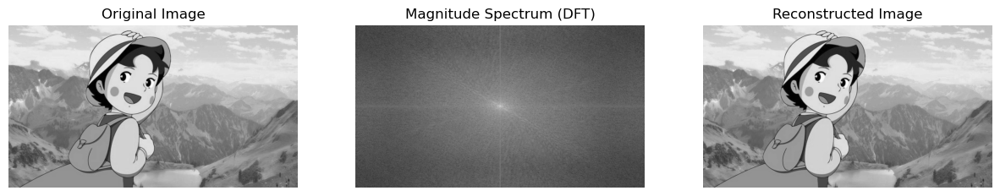

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the grayscale image
image = cv2.imread("C:/Users/student/Documents/Computer Vision 2023510051/Heidi.jpg", cv2.IMREAD_GRAYSCALE)

# Perform Discrete Fourier Transform (DFT)
dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

# Compute magnitude spectrum
magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]) + 1)

# Perform inverse DFT to reconstruct the image
dft_ishift = np.fft.ifftshift(dft_shift)
img_reconstructed = cv2.idft(dft_ishift)
img_reconstructed = cv2.magnitude(img_reconstructed[:, :, 0], img_reconstructed[:, :, 1])

# Normalize the reconstructed image for display
img_reconstructed = cv2.normalize(img_reconstructed, None, 0, 255, cv2.NORM_MINMAX)
img_reconstructed = np.uint8(img_reconstructed)

# Display the original image, DFT magnitude spectrum, and reconstructed image
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap="gray")
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(magnitude_spectrum, cmap="gray")
plt.title("Magnitude Spectrum (DFT)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(img_reconstructed, cmap="gray")
plt.title("Reconstructed Image")
plt.axis("off")

plt.show()


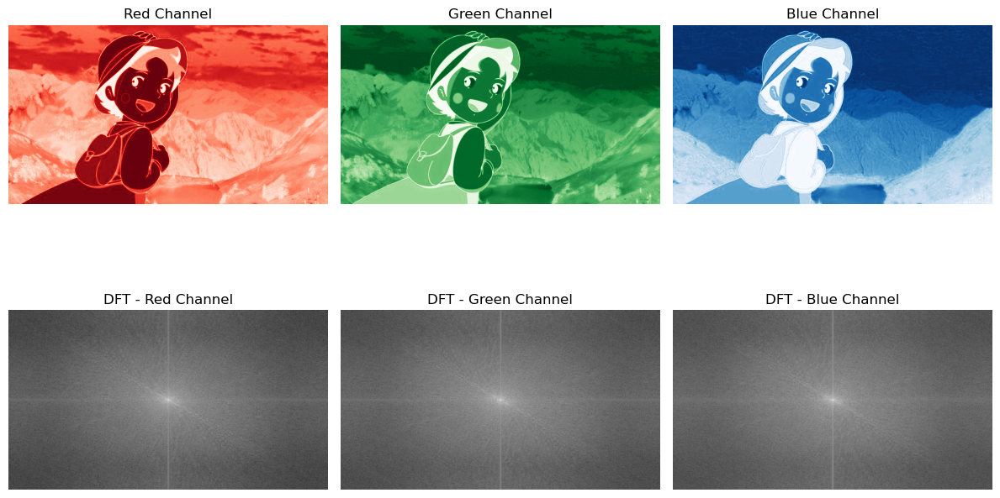

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the RGB image
image = cv2.imread("C:/Users/student/Documents/Computer Vision 2023510051/Heidi.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Function to compute DFT and magnitude spectrum
def compute_dft(channel):
    dft = cv2.dft(np.float32(channel), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]) + 1)
    return magnitude_spectrum

# Split the channels
R, G, B = cv2.split(image)

# Compute DFT for each channel
R_dft = compute_dft(R)
G_dft = compute_dft(G)
B_dft = compute_dft(B)

# Display the images and their magnitude spectra
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

axes[0, 0].imshow(R, cmap="Reds")
axes[0, 0].set_title("Red Channel")
axes[0, 0].axis("off")

axes[0, 1].imshow(G, cmap="Greens")
axes[0, 1].set_title("Green Channel")
axes[0, 1].axis("off")

axes[0, 2].imshow(B, cmap="Blues")
axes[0, 2].set_title("Blue Channel")
axes[0, 2].axis("off")

axes[1, 0].imshow(R_dft, cmap="gray")
axes[1, 0].set_title("DFT - Red Channel")
axes[1, 0].axis("off")

axes[1, 1].imshow(G_dft, cmap="gray")
axes[1, 1].set_title("DFT - Green Channel")
axes[1, 1].axis("off")

axes[1, 2].imshow(B_dft, cmap="gray")
axes[1, 2].set_title("DFT - Blue Channel")
axes[1, 2].axis("off")

plt.tight_layout()
plt.show()


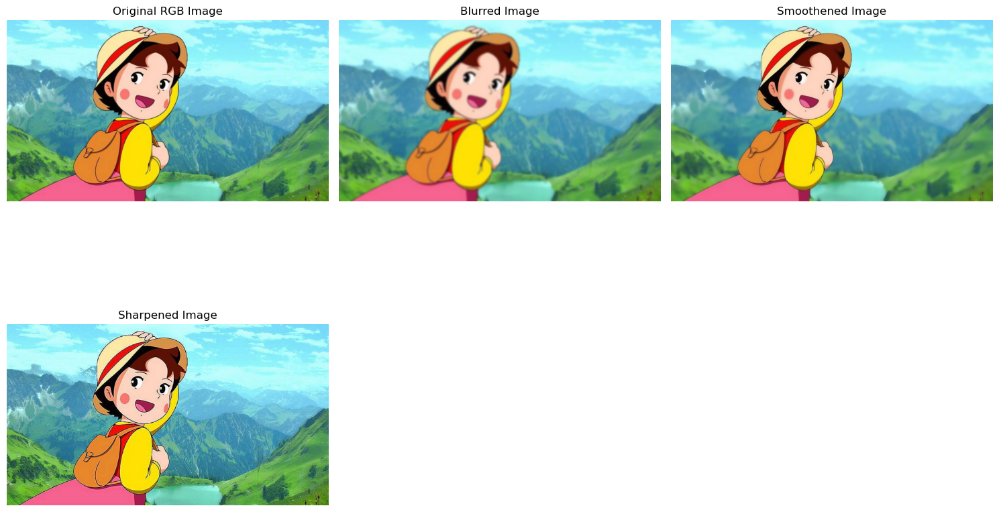

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the RGB image
image = cv2.imread("C:/Users/student/Documents/Computer Vision 2023510051/Heidi.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Apply strong Gaussian blur
blurred = cv2.GaussianBlur(image, (15, 15), 0)

# Apply strong bilateral filter for smoothening
smoothened = cv2.bilateralFilter(image, 15, 100, 100)

# Define sharpening kernel
kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

# Apply sharpening filter
sharpened = cv2.filter2D(image, -1, kernel)

# Display the original and processed images
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(image)
plt.title("Original RGB Image")
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(blurred)
plt.title("Blurred Image")
plt.axis("off")

plt.subplot(2, 3, 3)
plt.imshow(smoothened)
plt.title("Smoothened Image")
plt.axis("off")

plt.subplot(2, 3, 4)
plt.imshow(sharpened)
plt.title("Sharpened Image")
plt.axis("off")

plt.tight_layout()
plt.show()


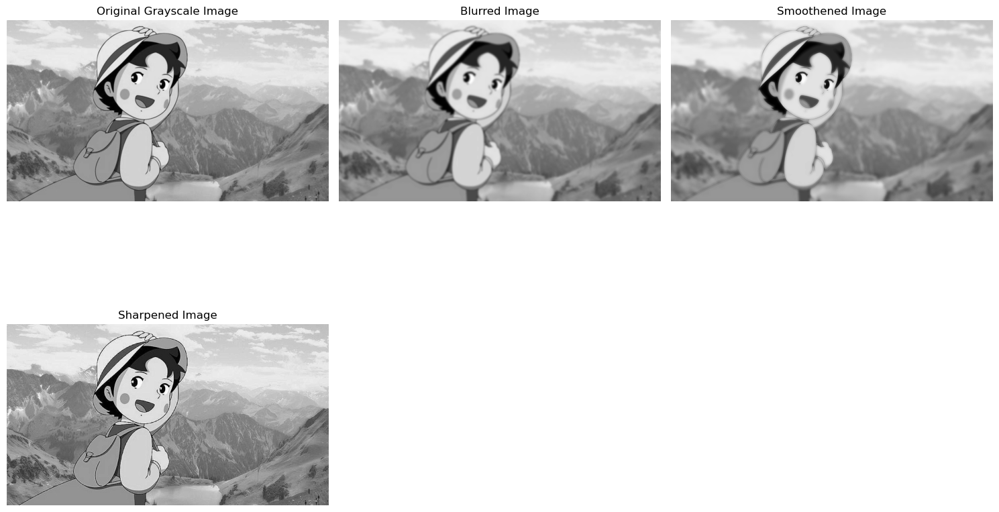

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the grayscale image
image = cv2.imread("C:/Users/student/Documents/Computer Vision 2023510051/Heidi.jpg", cv2.IMREAD_GRAYSCALE)

# Apply strong Gaussian blur
blurred = cv2.GaussianBlur(image, (15, 15), 0)

# Apply strong bilateral filter for smoothening
smoothened = cv2.bilateralFilter(image, 15, 100, 100)

# Define sharpening kernel
kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

# Apply sharpening filter
sharpened = cv2.filter2D(image, -1, kernel)

# Display the original and processed images
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(image, cmap="gray")
plt.title("Original Grayscale Image")
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(blurred, cmap="gray")
plt.title("Blurred Image")
plt.axis("off")

plt.subplot(2, 3, 3)
plt.imshow(smoothened, cmap="gray")
plt.title("Smoothened Image")
plt.axis("off")

plt.subplot(2, 3, 4)
plt.imshow(sharpened, cmap="gray")
plt.title("Sharpened Image")
plt.axis("off")

plt.tight_layout()
plt.show()


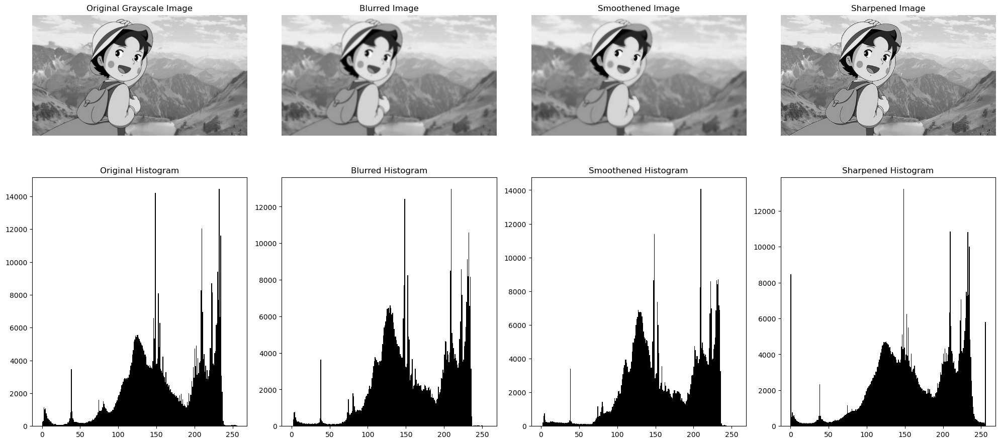

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the grayscale image
image = cv2.imread("C:/Users/student/Documents/Computer Vision 2023510051/Heidi.jpg", cv2.IMREAD_GRAYSCALE)

# Apply strong Gaussian blur
blurred = cv2.GaussianBlur(image, (15, 15), 0)

# Apply strong bilateral filter for smoothening
smoothened = cv2.bilateralFilter(image, 15, 100, 100)

# Define sharpening kernel
kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

# Apply sharpening filter
sharpened = cv2.filter2D(image, -1, kernel)

# Function to plot histogram
def plot_histogram(ax, img, title):
    ax.hist(img.ravel(), bins=256, range=[0, 256], color='black')
    ax.set_title(f"{title} Histogram")

# Display the original, processed images, and histograms side by side
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

# Original image and histogram
axes[0, 0].imshow(image, cmap="gray")
axes[0, 0].set_title("Original Grayscale Image")
axes[0, 0].axis("off")
plot_histogram(axes[1, 0], image, "Original")

# Blurred image and histogram
axes[0, 1].imshow(blurred, cmap="gray")
axes[0, 1].set_title("Blurred Image")
axes[0, 1].axis("off")
plot_histogram(axes[1, 1], blurred, "Blurred")

# Smoothened image and histogram
axes[0, 2].imshow(smoothened, cmap="gray")
axes[0, 2].set_title("Smoothened Image")
axes[0, 2].axis("off")
plot_histogram(axes[1, 2], smoothened, "Smoothened")

# Sharpened image and histogram
axes[0, 3].imshow(sharpened, cmap="gray")
axes[0, 3].set_title("Sharpened Image")
axes[0, 3].axis("off")
plot_histogram(axes[1, 3], sharpened, "Sharpened")

plt.tight_layout()
plt.show()


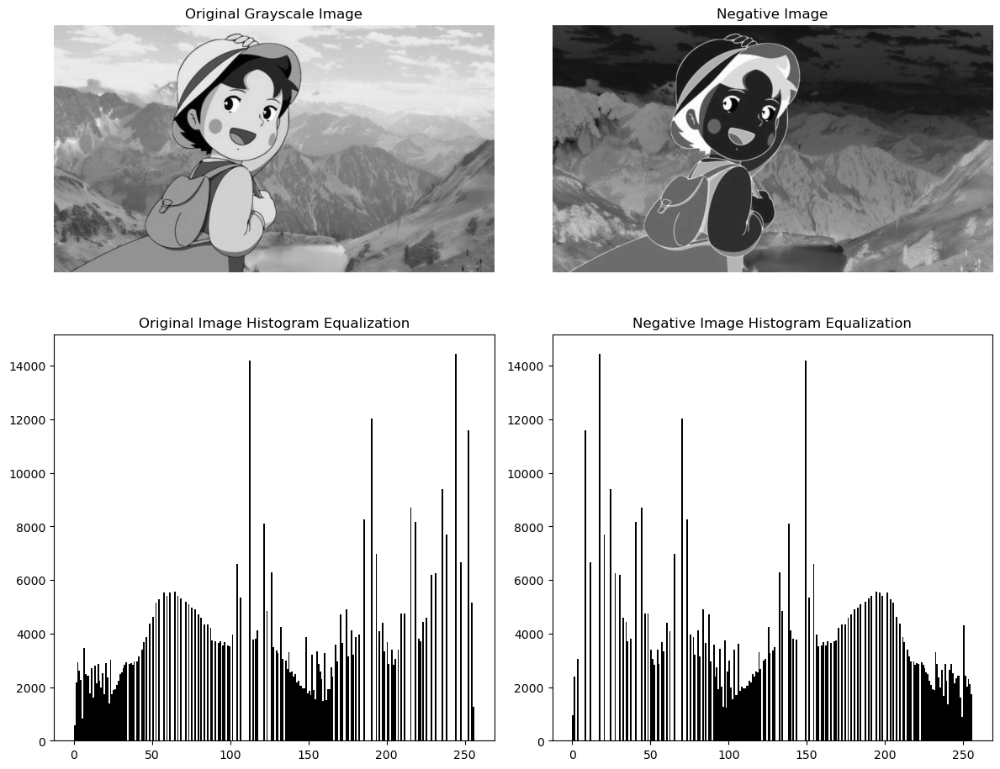

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the grayscale image
image = cv2.imread("C:/Users/student/Documents/Computer Vision 2023510051/Heidi.jpg", cv2.IMREAD_GRAYSCALE)

# Negative transformation (255 - pixel value)
negative = 255 - image

# Function to compute histogram equalization
def hist_equalization(img):
    return cv2.equalizeHist(img)

# Perform histogram equalization on the original and negative images
image_eq = hist_equalization(image)
negative_eq = hist_equalization(negative)

# Plot the images and histograms
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Display original and negative images
axes[0, 0].imshow(image, cmap="gray")
axes[0, 0].set_title("Original Grayscale Image")
axes[0, 0].axis("off")

axes[0, 1].imshow(negative, cmap="gray")
axes[0, 1].set_title("Negative Image")
axes[0, 1].axis("off")

# Plot histograms for original and negative images
axes[1, 0].hist(image_eq.ravel(), bins=256, range=[0, 256], color='black')
axes[1, 0].set_title("Original Image Histogram Equalization")


axes[1, 1].hist(negative_eq.ravel(), bins=256, range=[0, 256], color='black')
axes[1, 1].set_title("Negative Image Histogram Equalization")


plt.tight_layout()
plt.show()


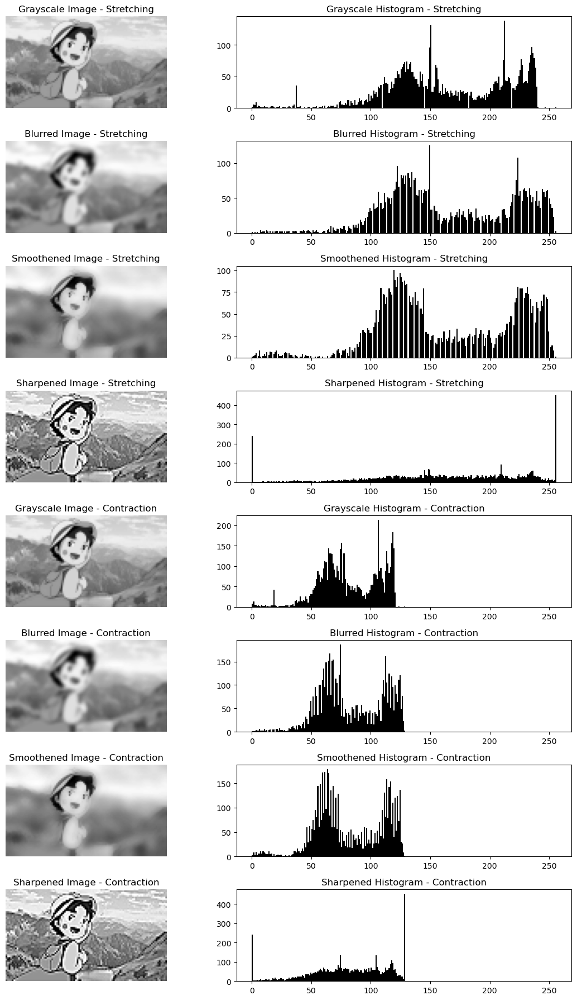

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the RGB image
image = cv2.imread("C:/Users/student/Documents/Computer Vision 2023510051/Heidi.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Resize the image to a scale factor of 0.1 (for better visualization)
scale_factor = 0.1
image_resized = cv2.resize(image, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_AREA)

# Convert to grayscale
gray = cv2.cvtColor(image_resized, cv2.COLOR_RGB2GRAY)

# Apply blurring
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Apply smoothening using bilateral filter
smoothened = cv2.bilateralFilter(gray, 9, 75, 75)

# Apply sharpening
kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
sharpened = cv2.filter2D(gray, -1, kernel)

# Function to apply histogram stretching
def hist_stretching(img):
    min_val = np.min(img)
    max_val = np.max(img)
    stretched = ((img - min_val) / (max_val - min_val)) * 255
    return stretched.astype(np.uint8)

# Function to apply histogram contraction
def hist_contraction(img):
    min_val = np.min(img)
    max_val = np.max(img)
    contracted = (img - min_val) / (max_val - min_val) * 128  # Reducing the range
    return contracted.astype(np.uint8)

# Apply histogram stretching
gray_stretched = hist_stretching(gray)
blurred_stretched = hist_stretching(blurred)
smoothened_stretched = hist_stretching(smoothened)
sharpened_stretched = hist_stretching(sharpened)

# Apply histogram contraction
gray_contracted = hist_contraction(gray)
blurred_contracted = hist_contraction(blurred)
smoothened_contracted = hist_contraction(smoothened)
sharpened_contracted = hist_contraction(sharpened)

# Plot the images and histograms for stretching and contraction
fig, axes = plt.subplots(8, 2, figsize=(12, 18))

titles = ["Grayscale", "Blurred", "Smoothened", "Sharpened"]
stretched = [gray_stretched, blurred_stretched, smoothened_stretched, sharpened_stretched]
contracted = [gray_contracted, blurred_contracted, smoothened_contracted, sharpened_contracted]

for i in range(4):
    # Plot stretched images
    axes[i, 0].imshow(stretched[i], cmap="gray")
    axes[i, 0].set_title(f"{titles[i]} Image - Stretching")
    axes[i, 0].axis("off")
    axes[i, 1].hist(stretched[i].ravel(), bins=256, range=[0, 256], color='black')
    axes[i, 1].set_title(f"{titles[i]} Histogram - Stretching")

    # Plot contracted images
    axes[i + 4, 0].imshow(contracted[i], cmap="gray")
    axes[i + 4, 0].set_title(f"{titles[i]} Image - Contraction")
    axes[i + 4, 0].axis("off")
    axes[i + 4, 1].hist(contracted[i].ravel(), bins=256, range=[0, 256], color='black')
    axes[i + 4, 1].set_title(f"{titles[i]} Histogram - Contraction")

plt.tight_layout()
plt.show()


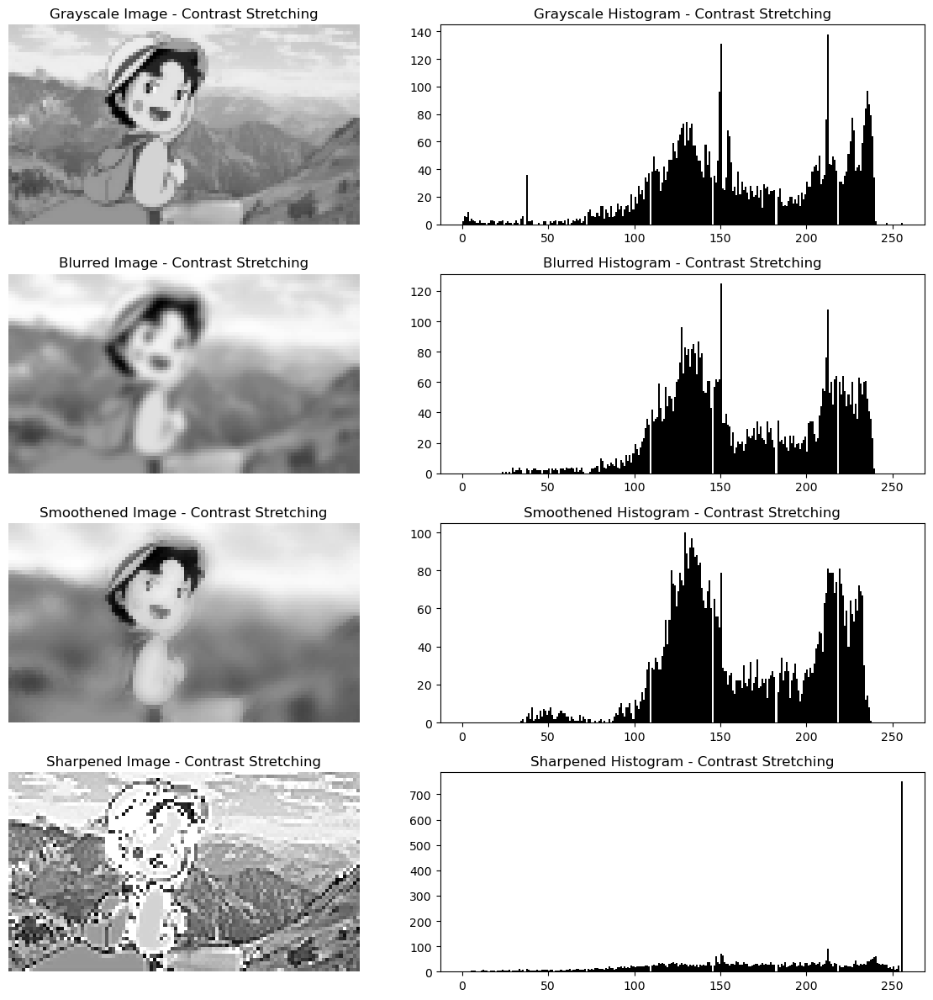

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the RGB image
image = cv2.imread("C:/Users/student/Documents/Computer Vision 2023510051/Heidi.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Resize the image to a scale factor of 0.1 (for better visualization)
scale_factor = 0.1
image_resized = cv2.resize(image, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_AREA)

# Convert to grayscale
gray = cv2.cvtColor(image_resized, cv2.COLOR_RGB2GRAY)

# Apply blurring
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Apply smoothening using bilateral filter
smoothened = cv2.bilateralFilter(gray, 9, 75, 75)

# Apply sharpening
kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
sharpened = cv2.filter2D(gray, -1, kernel)

# Function to perform contrast stretching
def contrast_stretching(img, low_in, high_in, low_out, high_out):
    # Stretch the contrast
    stretched = ((img - low_in) / (high_in - low_in)) * (high_out - low_out) + low_out
    # Clip values to ensure they are in valid range
    return np.clip(stretched, 0, 255).astype(np.uint8)

# Apply contrast stretching
low_in, high_in = np.min(gray), np.max(gray)  # Use min and max of the original image
low_out, high_out = 0, 255  # Desired output range

gray_stretched = contrast_stretching(gray, low_in, high_in, low_out, high_out)
blurred_stretched = contrast_stretching(blurred, low_in, high_in, low_out, high_out)
smoothened_stretched = contrast_stretching(smoothened, low_in, high_in, low_out, high_out)
sharpened_stretched = contrast_stretching(sharpened, low_in, high_in, low_out, high_out)

# Plot the images and histograms for contrast stretching
fig, axes = plt.subplots(4, 2, figsize=(12, 12))

titles = ["Grayscale", "Blurred", "Smoothened", "Sharpened"]
stretched = [gray_stretched, blurred_stretched, smoothened_stretched, sharpened_stretched]

for i in range(4):
    # Plot stretched images
    axes[i, 0].imshow(stretched[i], cmap="gray")
    axes[i, 0].set_title(f"{titles[i]} Image - Contrast Stretching")
    axes[i, 0].axis("off")
    axes[i, 1].hist(stretched[i].ravel(), bins=256, range=[0, 256], color='black')
    axes[i, 1].set_title(f"{titles[i]} Histogram - Contrast Stretching")

plt.tight_layout()
plt.show()


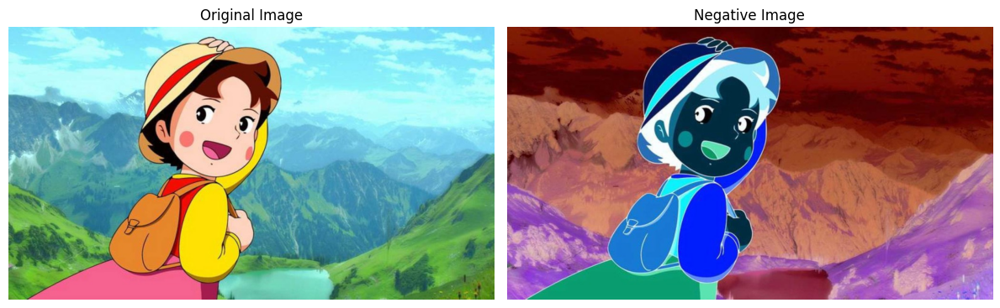

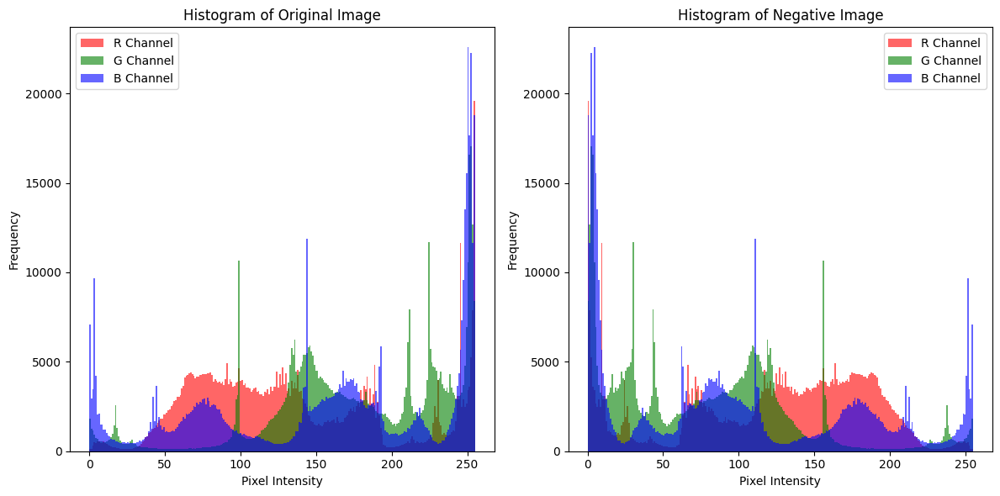

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
image = cv2.imread("/content/heidi.jpg")
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
negative_image = 255 - image
negative_image_rgb = cv2.cvtColor(negative_image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(negative_image_rgb)
plt.title('Negative Image')
plt.axis('off')

plt.tight_layout()
plt.show()
def plot_histogram(image, ax, title):
    colors = ['r', 'g', 'b']
    for i, color in enumerate(colors):
        ax.hist(image[:, :, i].flatten(), bins=256, color=color, alpha=0.6, label=f'{color.upper()} Channel')

    ax.set_title(title)
    ax.set_xlabel('Pixel Intensity')
    ax.set_ylabel('Frequency')
    ax.legend()
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
plot_histogram(image_rgb, axes[0], 'Histogram of Original Image')
plot_histogram(negative_image_rgb, axes[1], 'Histogram of Negative Image')
plt.tight_layout()
plt.show()


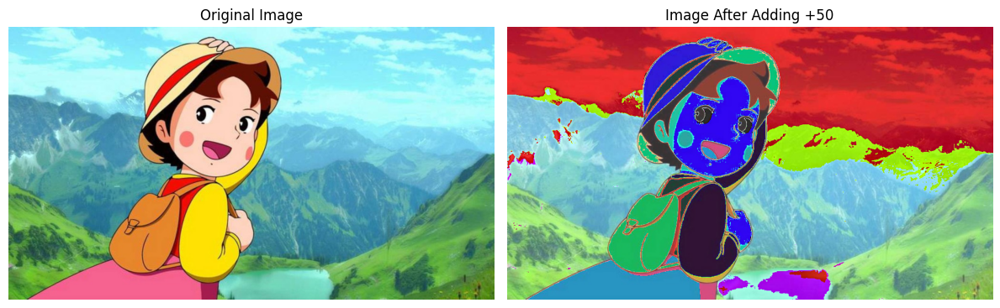

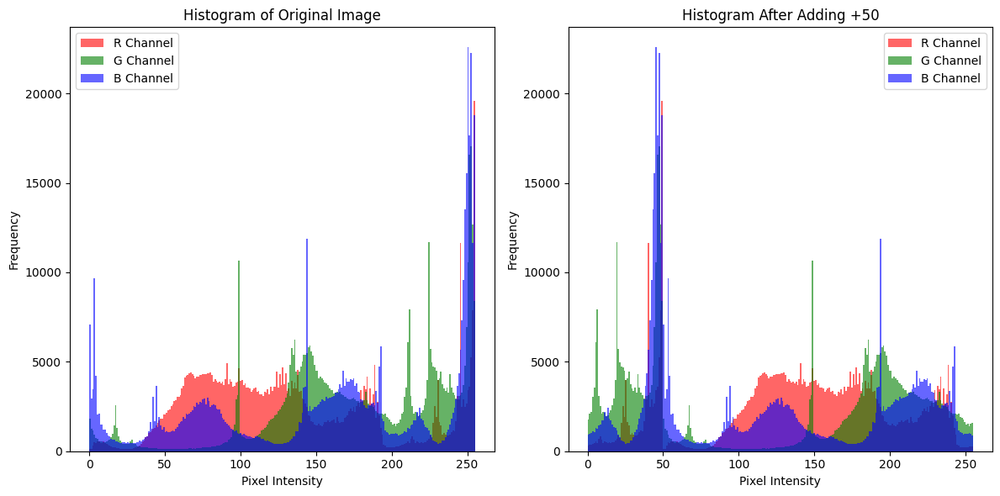

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
image = cv2.imread("/content/heidi.jpg")
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
increased_image = np.clip(image + 50, 0, 255).astype(np.uint8)
increased_image_rgb = cv2.cvtColor(increased_image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(increased_image_rgb)
plt.title('Image After Adding +50')
plt.axis('off')
plt.tight_layout()
plt.show()
def plot_histogram(image, ax, title):
    colors = ['r', 'g', 'b']
    for i, color in enumerate(colors):
        ax.hist(image[:, :, i].flatten(), bins=256, color=color, alpha=0.6, label=f'{color.upper()} Channel')
    ax.set_title(title)
    ax.set_xlabel('Pixel Intensity')
    ax.set_ylabel('Frequency')
    ax.legend()
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
plot_histogram(image_rgb, axes[0], 'Histogram of Original Image')
plot_histogram(increased_image_rgb, axes[1], 'Histogram After Adding +50')
plt.tight_layout()
plt.show()


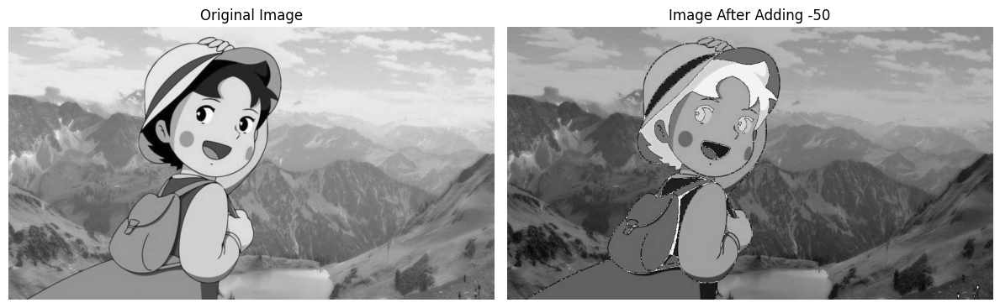

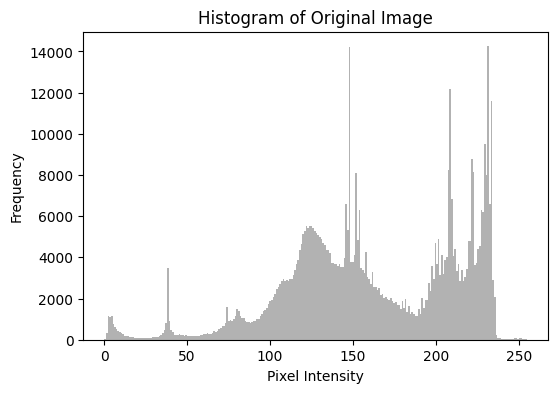

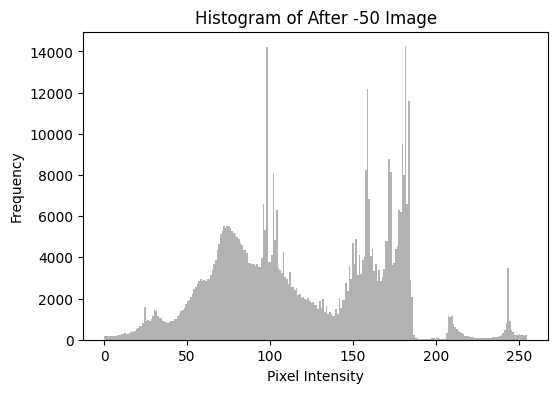

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
gray_image = cv2.cvtColor(cv2.imread("/content/heidi.jpg"), cv2.COLOR_BGR2GRAY)
darkened_image = np.clip(gray_image - 50, 0, 255).astype(np.uint8)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(darkened_image, cmap='gray')
plt.title('Image After Adding -50')
plt.axis('off')

plt.tight_layout()
plt.show()

for img, title in [(gray_image, 'Original'), (darkened_image, 'After -50')]:
    plt.figure(figsize=(6, 4))
    plt.hist(img.flatten(), bins=256, color='gray', alpha=0.6)
    plt.title(f'Histogram of {title} Image')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.show()


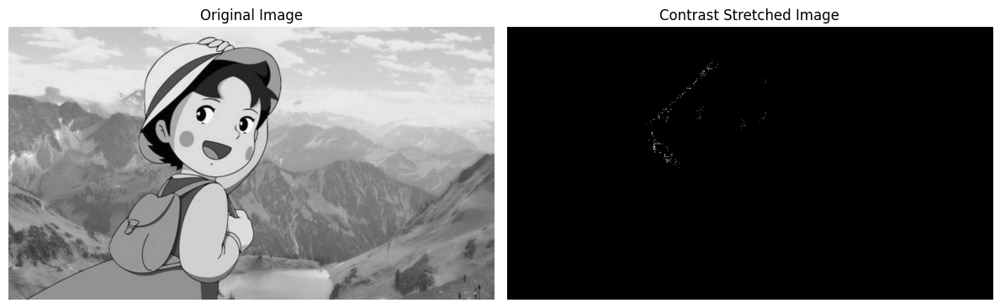

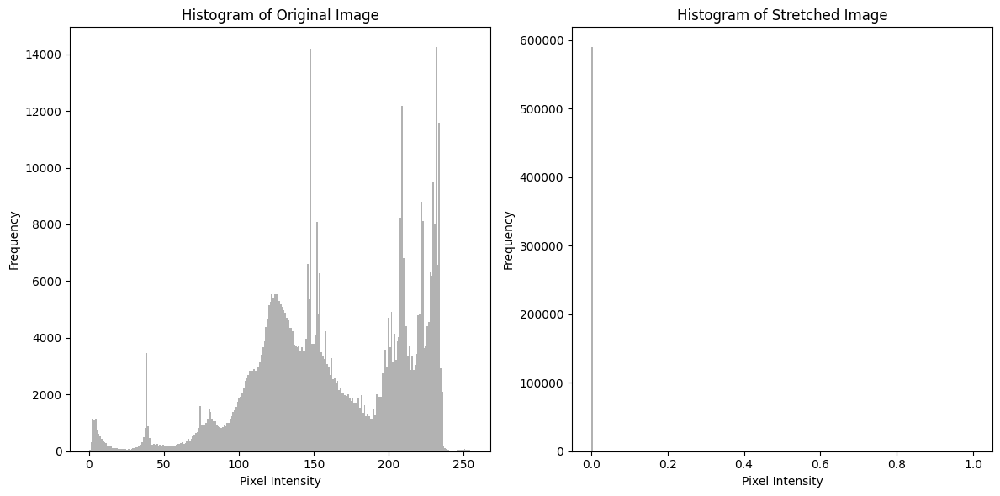

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
image = cv2.imread("/content/heidi.jpg")
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
I_min = np.min(gray_image)
I_max = np.max(gray_image)
stretched_image = np.clip(((gray_image - I_min) * 255) / (I_max - I_min), 0, 255).astype(np.uint8)
stretched_image_rgb = cv2.cvtColor(stretched_image, cv2.COLOR_GRAY2RGB)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(stretched_image, cmap='gray')
plt.title('Contrast Stretched Image')
plt.axis('off')
plt.tight_layout()
plt.show()
def plot_histogram(image, ax, title):
    ax.hist(image.flatten(), bins=256, color='gray', alpha=0.6)
    ax.set_title(title)
    ax.set_xlabel('Pixel Intensity')
    ax.set_ylabel('Frequency')
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
plot_histogram(gray_image, axes[0], 'Histogram of Original Image')
plot_histogram(stretched_image, axes[1], 'Histogram of Stretched Image')
plt.tight_layout()
plt.show()


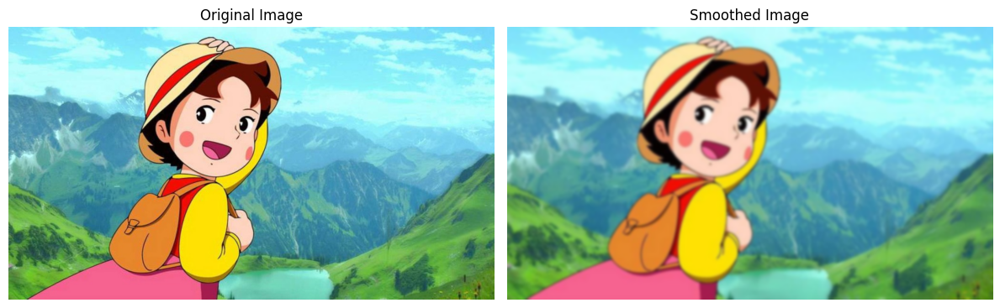

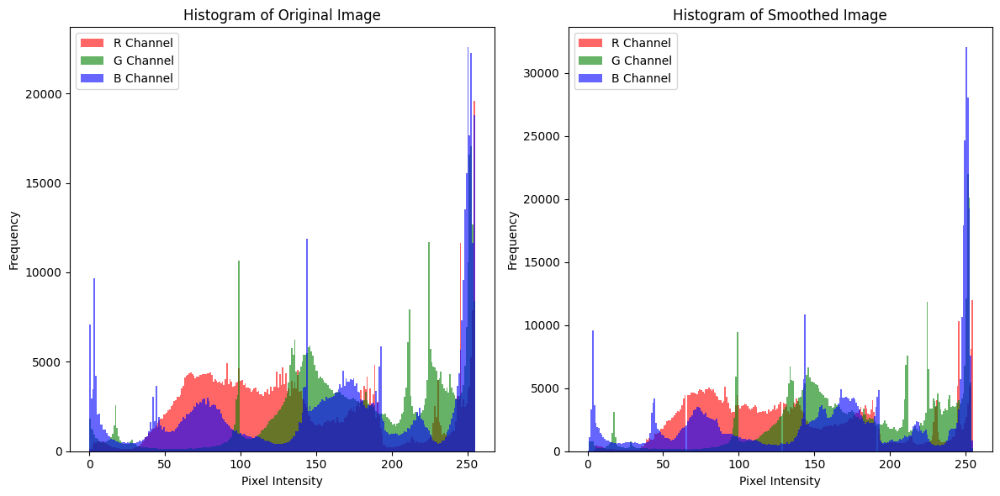

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
image = cv2.imread("/content/heidi.jpg")
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
smoothed_image = cv2.GaussianBlur(image, (15, 15), 0)
smoothed_image_rgb = cv2.cvtColor(smoothed_image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(smoothed_image_rgb)
plt.title('Smoothed Image')
plt.axis('off')

plt.tight_layout()
plt.show()
def plot_histogram(image, ax, title):
    colors = ['r', 'g', 'b']
    for i, color in enumerate(colors):
        ax.hist(image[:, :, i].flatten(), bins=256, color=color, alpha=0.6, label=f'{color.upper()} Channel')

    ax.set_title(title)
    ax.set_xlabel('Pixel Intensity')
    ax.set_ylabel('Frequency')
    ax.legend()
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
plot_histogram(image_rgb, axes[0], 'Histogram of Original Image')
plot_histogram(smoothed_image_rgb, axes[1], 'Histogram of Smoothed Image')
plt.tight_layout()
plt.show()


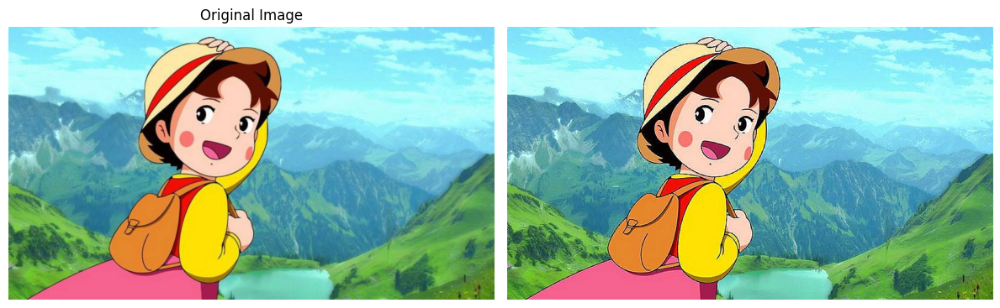

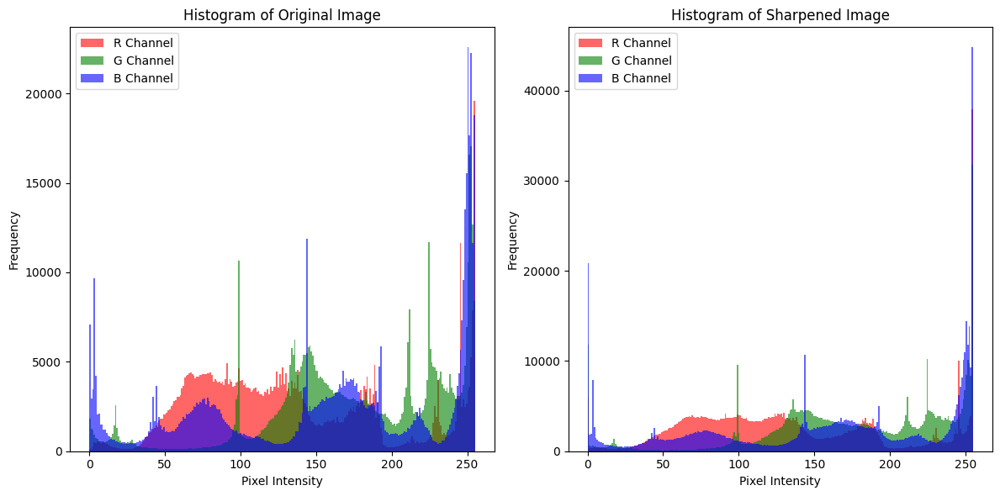

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
image = cv2.imread("/content/heidi.jpg")
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
sharpening_kernel = np.array([[0, -1, 0],
                              [-1, 5, -1],
                              [0, -1, 0]])
sharpened_image = cv2.filter2D(image, -1, sharpening_kernel)
sharpened_image_rgb = cv2.cvtColor(sharpened_image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(sharpened_image_rgb)
plt.axis('off')
plt.tight_layout()
plt.show()
def plot_histogram(image, ax, title):

    colors = ['r', 'g', 'b']
    for i, color in enumerate(colors):
        ax.hist(image[:, :, i].flatten(), bins=256, color=color, alpha=0.6, label=f'{color.upper()} Channel')

    ax.set_title(title)
    ax.set_xlabel('Pixel Intensity')
    ax.set_ylabel('Frequency')
    ax.legend()

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
plot_histogram(image_rgb, axes[0], 'Histogram of Original Image')
plot_histogram(sharpened_image_rgb, axes[1], 'Histogram of Sharpened Image')
plt.tight_layout()
plt.show()


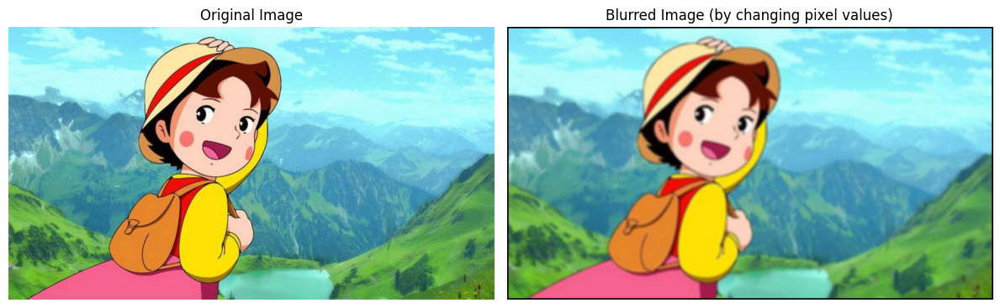

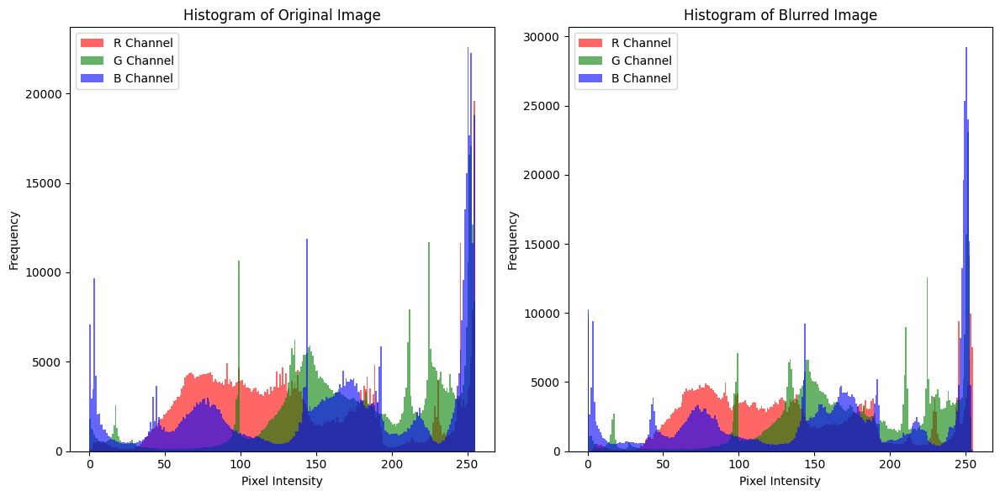

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
image = cv2.imread("/content/heidi.jpg")
height, width, channels = image.shape
blurred_image = np.zeros_like(image)
kernel_size = 7
kernel_radius = kernel_size // 2
for i in range(kernel_radius, height - kernel_radius):
    for j in range(kernel_radius, width - kernel_radius):
        for c in range(channels):
            region = image[i - kernel_radius:i + kernel_radius + 1, j - kernel_radius:j + kernel_radius + 1, c]
            blurred_image[i, j, c] = np.mean(region)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB))
plt.title('Blurred Image (by changing pixel values)')
plt.axis('off')
plt.tight_layout()
plt.show()

def plot_histogram(image, ax, title):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    colors = ['r', 'g', 'b']
    for i, color in enumerate(colors):
        ax.hist(image_rgb[:, :, i].flatten(), bins=256, color=color, alpha=0.6, label=f'{color.upper()} Channel')
    ax.set_title(title)
    ax.set_xlabel('Pixel Intensity')
    ax.set_ylabel('Frequency')
    ax.legend()
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
plot_histogram(image, axes[0], 'Histogram of Original Image')
plot_histogram(blurred_image, axes[1], 'Histogram of Blurred Image')
plt.tight_layout()
plt.show()


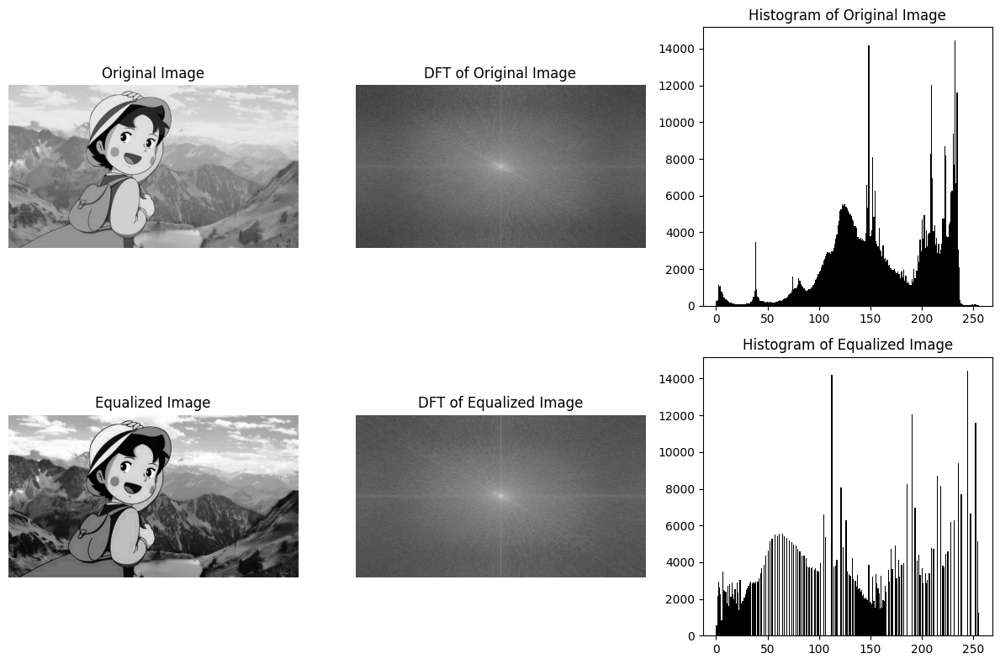

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
image = cv2.imread("/content/heidi.jpg", cv2.IMREAD_GRAYSCALE)
equalized_image = cv2.equalizeHist(image)
dft_original = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_original_shifted = np.fft.fftshift(dft_original)
magnitude_original = cv2.magnitude(dft_original_shifted[:,:,0], dft_original_shifted[:,:,1])
magnitude_original_log = np.log(magnitude_original + 1)
dft_equalized = cv2.dft(np.float32(equalized_image), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_equalized_shifted = np.fft.fftshift(dft_equalized)
magnitude_equalized = cv2.magnitude(dft_equalized_shifted[:,:,0], dft_equalized_shifted[:,:,1])
magnitude_equalized_log = np.log(magnitude_equalized + 1)
plt.figure(figsize=(12, 8))
plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.subplot(2, 3, 2)
plt.imshow(magnitude_original_log, cmap='gray')
plt.title('DFT of Original Image')
plt.axis('off')
plt.subplot(2, 3, 3)
plt.hist(image.ravel(), bins=256, range=(0, 256), color='black')
plt.title('Histogram of Original Image')
plt.subplot(2, 3, 4)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')
plt.subplot(2, 3, 5)
plt.imshow(magnitude_equalized_log, cmap='gray')
plt.title('DFT of Equalized Image')
plt.axis('off')
plt.subplot(2, 3, 6)
plt.hist(equalized_image.ravel(), bins=256, range=(0, 256), color='black')
plt.title('Histogram of Equalized Image')
plt.tight_layout()
plt.show()
